## Importing libraries

In [1]:
import pandas as pd # For most data manipulation and cleaning
import numpy as np # For some data manipulation
from imblearn.over_sampling import SMOTE # For over-sampling
from statsmodels.stats.outliers_influence import variance_inflation_factor # For feature selection
from sklearn.preprocessing import MinMaxScaler, PowerTransformer # Scaling features, Transforming features
from sklearn.feature_selection import RFE, SelectKBest, mutual_info_classif, SelectFromModel # Feature selection
from sklearn.ensemble import RandomForestClassifier # For feature selection using a wrapper
import torch # To build the Dense Neural Network (DNN) model
import torch.nn as nn # To build the Dense Neural Network (DNN) model
import torch.optim as optim # To build the Dense Neural Network (DNN) model
from torch.utils.data import DataLoader, TensorDataset # To use mini batches, to convert to tensors
from sklearn.model_selection import StratifiedKFold # For evaluation
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score, confusion_matrix # For evaluation
import xgboost as xgb # Used to create the XGBoost Classifier
from xgboost import XGBClassifier # Used to create the XGBoost Classifier
import seaborn as sns # For visualization
import matplotlib.pyplot as plt # For visualization
import itertools # To create a set of all hyperparameter combinations used in the search grid
from time import time # To get run times

pd.set_option('display.max_columns', None) # Removing column number constraint

## Reading dataframe

In [2]:
telco = pd.read_csv('telco.csv')

telco.head()

,Customer ID,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,City,Zip Code,Latitude,Longitude,Population,Quarter,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Customer Status,Churn Label,Churn Score,CLTV,Churn Category,Churn Reason
0,8779-QRDMV,Male,78,No,Yes,No,No,0,United States,California,Los Angeles,90022,34.023810,-118.156582,68701,Q3,No,0,1,NaN,No,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,3,Churned,Yes,91,5433,Competitor,Competitor offered more data
1,7495-OOKFY,Female,74,No,Yes,Yes,Yes,1,United States,California,Los Angeles,90063,34.044271,-118.185237,55668,Q3,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,3,Churned,Yes,69,5302,Competitor,Competitor made better offer
2,1658-BYGOY,Male,71,No,Yes,No,Yes,3,United States,California,Los Angeles,90065,34.108833,-118.229715,47534,Q3,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,2,Churned,Yes,81,3179,Competitor,Competitor made better offer
3,4598-XLKNJ,Female,78,No,Yes,Yes,Yes,1,United States,California,Inglewood,90303,33.936291,-118.332639,27778,Q3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07,2,Churned,Yes,88,5337,Dissatisfaction,Limited range of services
4,4846-WHAFZ,Female,80,No,Yes,Yes,Yes,1,United States,California,Whittier,90602,33.972119,-118.020188,26265,Q3,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36,2,Churned,Yes,67,2793,Price,Extra data charges


## Exploratory Data Analysis

#### Looking at how many features there are in the dataframe as well as their names and data types

In [3]:
print(f'There are {len(telco.columns)} features in the dataframe:')

for col in telco.columns:
    
    print(f'{col}: {type(telco[col][0])}')

There are 50 features in the dataframe:
Customer ID: <class 'str'>
Gender: <class 'str'>
Age: <class 'numpy.int64'>
Under 30: <class 'str'>
Senior Citizen: <class 'str'>
Married: <class 'str'>
Dependents: <class 'str'>
Number of Dependents: <class 'numpy.int64'>
Country: <class 'str'>
State: <class 'str'>
City: <class 'str'>
Zip Code: <class 'numpy.int64'>
Latitude: <class 'numpy.float64'>
Longitude: <class 'numpy.float64'>
Population: <class 'numpy.int64'>
Quarter: <class 'str'>
Referred a Friend: <class 'str'>
Number of Referrals: <class 'numpy.int64'>
Tenure in Months: <class 'numpy.int64'>
Offer: <class 'float'>
Phone Service: <class 'str'>
Avg Monthly Long Distance Charges: <class 'numpy.float64'>
Multiple Lines: <class 'str'>
Internet Service: <class 'str'>
Internet Type: <class 'str'>
Avg Monthly GB Download: <class 'numpy.int64'>
Online Security: <class 'str'>
Online Backup: <class 'str'>
Device Protection Plan: <class 'str'>
Premium Tech Support: <class 'str'>
Streaming TV: <c

#### Splitting features into numeric, string and features to be dropped. Features to be dropped are the ones with either only one value (zero variance) or a string feature with way too many values (noise). Features and their unique values can be seen below. 

In [4]:
# Creating lists to store feature  names
str_cols = []
num_cols = []
to_drop = []

print(f'The dataframe has {len(telco)} instances.')
print('')

# For each column
for col in telco.columns:
    
    # If of the string type
    if type(telco[col][0]) == str:

        # Looking at unique values for each column
        print(f'The {col} column has {telco[col].nunique()} unique values: {telco[col].unique()}')
        print('')
        
        # And has either only one unique value or more than five unique values
        if telco[col].nunique() == 1 or telco[col].nunique() > 5:

            # Add to the to drop list
            to_drop.append(col)

        # Or, if it has less than or equal to five unique values
        else:

            # Adding column name to list of string columns
            str_cols.append(col)

    # Or, if of the numeric type
    elif type(telco[col][0]) != str and pd.isnull(telco[col][0]) == False:

        # Adding to numeric columns list
        num_cols.append(col)

The dataframe has 7043 instances.

The Customer ID column has 7043 unique values: ['8779-QRDMV' '7495-OOKFY' '1658-BYGOY' ... '2234-XADUH' '4801-JZAZL'
 '3186-AJIEK']

The Gender column has 2 unique values: ['Male' 'Female']

The Under 30 column has 2 unique values: ['No' 'Yes']

The Senior Citizen column has 2 unique values: ['Yes' 'No']

The Married column has 2 unique values: ['No' 'Yes']

The Dependents column has 2 unique values: ['No' 'Yes']

The Country column has 1 unique values: ['United States']

The State column has 1 unique values: ['California']

The City column has 1106 unique values: ['Los Angeles' 'Inglewood' 'Whittier' ... 'Topaz' 'Jacumba' 'Holtville']

The Quarter column has 1 unique values: ['Q3']

The Referred a Friend column has 2 unique values: ['No' 'Yes']

The Phone Service column has 2 unique values: ['No' 'Yes']

The Multiple Lines column has 2 unique values: ['No' 'Yes']

The Internet Service column has 2 unique values: ['Yes' 'No']

The Internet Type column

#### Looking for null values. A few features seem to have a significant amount of null values and removing them would shorten an already small dataframe, which is why for any feature with more than 10% of their values equal to null will be added to the list of features to be dropped.

In [5]:
telco.isna().sum()

Customer ID                             0
Gender                                  0
Age                                     0
Under 30                                0
Senior Citizen                          0
Married                                 0
Dependents                              0
Number of Dependents                    0
Country                                 0
State                                   0
City                                    0
Zip Code                                0
Latitude                                0
Longitude                               0
Population                              0
Quarter                                 0
Referred a Friend                       0
Number of Referrals                     0
Tenure in Months                        0
Offer                                3877
Phone Service                           0
Avg Monthly Long Distance Charges       0
Multiple Lines                          0
Internet Service                  

#### Adding columns with more than 10% of their values equal to null to the to drop list

In [6]:
for col in telco.columns:
    
    if telco[col].isna().sum() != 0 and telco[col].isna().sum()/len(telco) > 0.1:
        
        to_drop.append(col)

#### Looking at all columns, columns to be dropped and remaining columns. This was not intended to be a comprehensive feature selection, but rather cleaning the dataframe as some of these features are clearly not going to add any value due to either noise, zero variance or too many null values.

In [7]:
print('All columns:')
print(telco.columns)
print('')
print('To drop:')
print(to_drop)
print('')
print('Remaining columns:')
remaining = list(set(telco.columns) - set(to_drop))
print(remaining)

All columns:
Index(['Customer ID', 'Gender', 'Age', 'Under 30', 'Senior Citizen', 'Married',
       'Dependents', 'Number of Dependents', 'Country', 'State', 'City',
       'Zip Code', 'Latitude', 'Longitude', 'Population', 'Quarter',
       'Referred a Friend', 'Number of Referrals', 'Tenure in Months', 'Offer',
       'Phone Service', 'Avg Monthly Long Distance Charges', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
       'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charge', 'Total Charges', 'Total Refunds',
       'Total Extra Data Charges', 'Total Long Distance Charges',
       'Total Revenue', 'Satisfaction Score', 'Customer Status', 'Churn Label',
       'Churn Score', 'CLTV', 'Churn Category', 'Churn Reason'],
      dtype='object')

To drop:
['

#### Updating dataframe with remaining columns

In [8]:
telco2 = telco[remaining]

telco2.columns

Index(['Streaming Music', 'Under 30', 'Paperless Billing', 'Multiple Lines',
       'Satisfaction Score', 'Population', 'Number of Dependents', 'Married',
       'Premium Tech Support', 'Total Refunds', 'Longitude', 'Customer Status',
       'Internet Service', 'Device Protection Plan', 'Streaming TV',
       'Phone Service', 'Total Charges', 'Avg Monthly GB Download',
       'Churn Label', 'Online Security', 'Contract', 'Gender', 'Churn Score',
       'Age', 'Online Backup', 'Tenure in Months', 'Streaming Movies',
       'Total Extra Data Charges', 'Latitude', 'Payment Method',
       'Avg Monthly Long Distance Charges', 'Zip Code', 'CLTV',
       'Unlimited Data', 'Senior Citizen', 'Monthly Charge',
       'Referred a Friend', 'Dependents', 'Number of Referrals',
       'Total Long Distance Charges', 'Total Revenue'],
      dtype='object')

#### Creating dummies and looking at their names

In [9]:
telco3 = pd.get_dummies(telco2, dtype = int, drop_first = True)

set(telco3.columns) - set(telco2.columns)

{'Churn Label_Yes',
 'Contract_One Year',
 'Contract_Two Year',
 'Customer Status_Joined',
 'Customer Status_Stayed',
 'Dependents_Yes',
 'Device Protection Plan_Yes',
 'Gender_Male',
 'Internet Service_Yes',
 'Married_Yes',
 'Multiple Lines_Yes',
 'Online Backup_Yes',
 'Online Security_Yes',
 'Paperless Billing_Yes',
 'Payment Method_Credit Card',
 'Payment Method_Mailed Check',
 'Phone Service_Yes',
 'Premium Tech Support_Yes',
 'Referred a Friend_Yes',
 'Senior Citizen_Yes',
 'Streaming Movies_Yes',
 'Streaming Music_Yes',
 'Streaming TV_Yes',
 'Under 30_Yes',
 'Unlimited Data_Yes'}

#### Looking at all the columns in the dataframe

In [10]:
telco3.columns

Index(['Satisfaction Score', 'Population', 'Number of Dependents',
       'Total Refunds', 'Longitude', 'Total Charges',
       'Avg Monthly GB Download', 'Churn Score', 'Age', 'Tenure in Months',
       'Total Extra Data Charges', 'Latitude',
       'Avg Monthly Long Distance Charges', 'Zip Code', 'CLTV',
       'Monthly Charge', 'Number of Referrals', 'Total Long Distance Charges',
       'Total Revenue', 'Streaming Music_Yes', 'Under 30_Yes',
       'Paperless Billing_Yes', 'Multiple Lines_Yes', 'Married_Yes',
       'Premium Tech Support_Yes', 'Customer Status_Joined',
       'Customer Status_Stayed', 'Internet Service_Yes',
       'Device Protection Plan_Yes', 'Streaming TV_Yes', 'Phone Service_Yes',
       'Churn Label_Yes', 'Online Security_Yes', 'Contract_One Year',
       'Contract_Two Year', 'Gender_Male', 'Online Backup_Yes',
       'Streaming Movies_Yes', 'Payment Method_Credit Card',
       'Payment Method_Mailed Check', 'Unlimited Data_Yes',
       'Senior Citizen_Yes', '

#### Looking at descriptive statistics. Features such as satisfaction score are on a completely different scale than total charges, for example, which will require scaling.

In [11]:
telco3.describe()

,Satisfaction Score,Population,Number of Dependents,Total Refunds,Longitude,Total Charges,Avg Monthly GB Download,Churn Score,Age,Tenure in Months,Total Extra Data Charges,Latitude,Avg Monthly Long Distance Charges,Zip Code,CLTV,Monthly Charge,Number of Referrals,Total Long Distance Charges,Total Revenue,Streaming Music_Yes,Under 30_Yes,Paperless Billing_Yes,Multiple Lines_Yes,Married_Yes,Premium Tech Support_Yes,Customer Status_Joined,Customer Status_Stayed,Internet Service_Yes,Device Protection Plan_Yes,Streaming TV_Yes,Phone Service_Yes,Churn Label_Yes,Online Security_Yes,Contract_One Year,Contract_Two Year,Gender_Male,Online Backup_Yes,Streaming Movies_Yes,Payment Method_Credit Card,Payment Method_Mailed Check,Unlimited Data_Yes,Senior Citizen_Yes,Referred a Friend_Yes,Dependents_Yes
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,3.244924,22139.603294,0.468692,1.962182,-119.756684,2280.381264,20.515405,58.505040,46.509726,32.386767,6.860713,36.197455,22.958954,93486.070567,4400.295755,64.761692,1.951867,749.099262,3034.379056,0.353259,0.198921,0.592219,0.421837,0.483033,0.290217,0.064461,0.670169,0.783331,0.343888,0.384353,0.903166,0.265370,0.286668,0.220077,0.267358,0.504756,0.344881,0.387903,0.390317,0.054664,0.673719,0.162147,0.457476,0.231010
std,1.201657,21152.392837,0.962802,7.902614,2.154425,2266.220462,20.418940,21.170031,16.750352,24.542061,25.104978,2.468929,15.448113,1856.767505,1183.057152,30.090047,3.001199,846.660055,2865.204542,0.478016,0.399217,0.491457,0.493888,0.499748,0.453895,0.245590,0.470185,0.412004,0.475038,0.486477,0.295752,0.441561,0.452237,0.414328,0.442612,0.500013,0.475363,0.487307,0.487856,0.227340,0.468885,0.368612,0.498224,0.421508
min,1.000000,11.000000,0.000000,0.000000,-124.301372,18.800000,0.000000,5.000000,19.000000,1.000000,0.000000,32.555828,0.000000,90001.000000,2003.000000,18.250000,0.000000,0.000000,21.360000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,2344.000000,0.000000,0.000000,-121.788090,400.150000,3.000000,40.000000,32.000000,9.000000,0.000000,33.990646,9.210000,92101.000000,3469.000000,35.500000,0.000000,70.545000,605.610000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,17554.000000,0.000000,0.000000,-119.595293,1394.550000,17.000000,61.000000,46.000000,29.000000,0.000000,36.205465,22.890000,93518.000000,4527.000000,70.350000,0.000000,401.440000,2108.640000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,4.000000,36125.000000,0.000000,0.000000,-117.969795,3786.600000,27.000000,75.500000,60.000000,55.000000,0.000000,38.161321,36.395000,95329.000000,5380.500000,89.850000,3.000000,1191.100000,4801.145000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
max,5.000000,105285.000000,9.000000,49.790000,-114.192901,8684.800000,85.000000,96.000000,80.000000,72.000000,150.0

#### Looking at the distribution of each variable. There seem to be distributions that are right skewed, some there are left skewed, some that are bimodal thus making transformations likely to be needed.

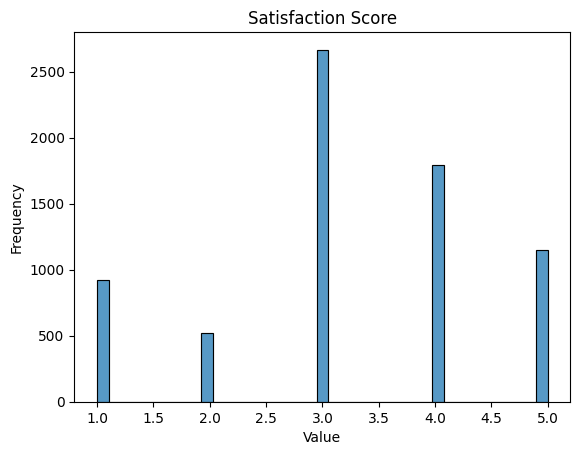

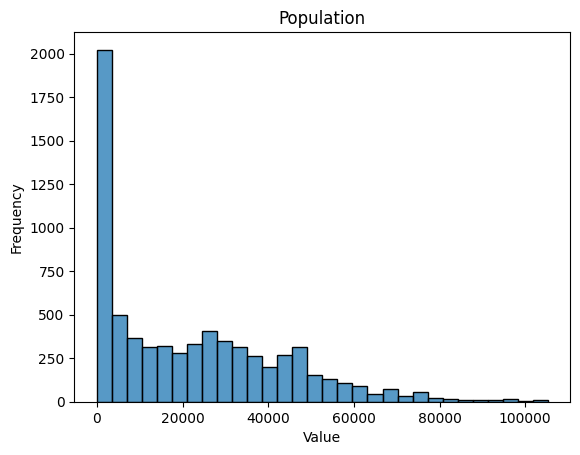

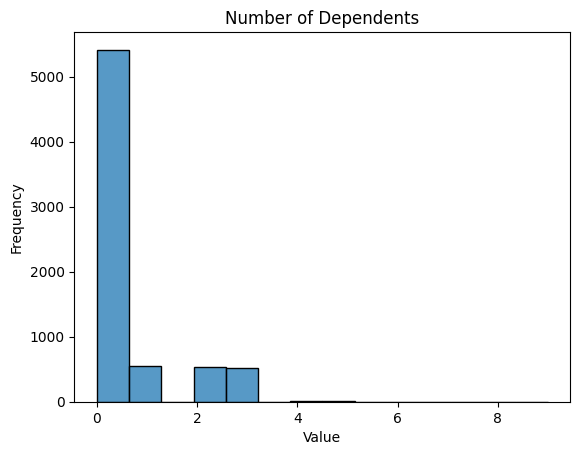

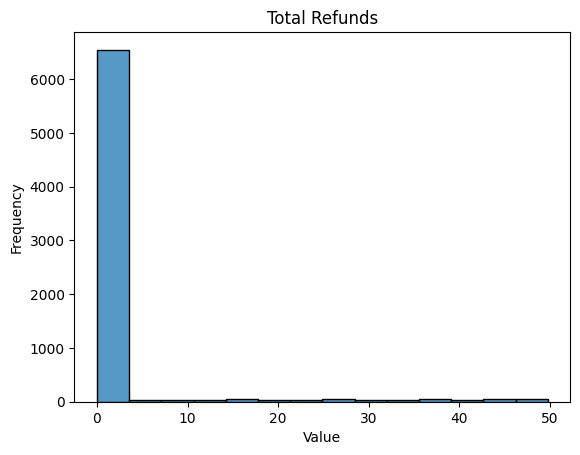

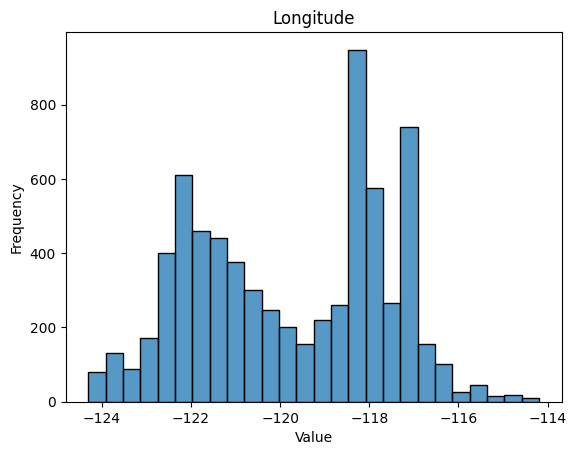

...

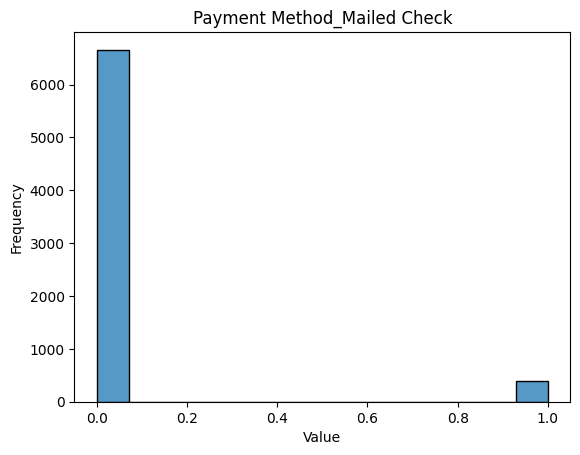

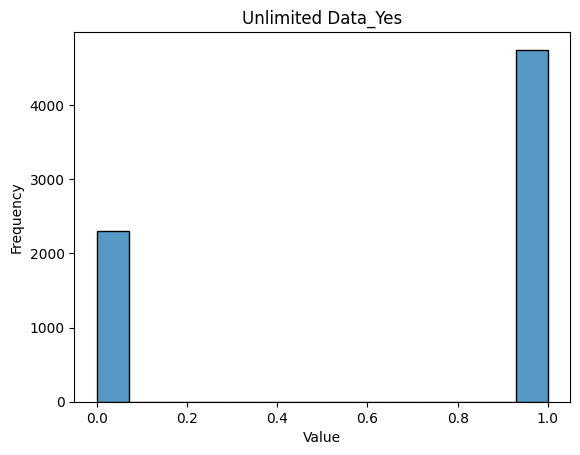

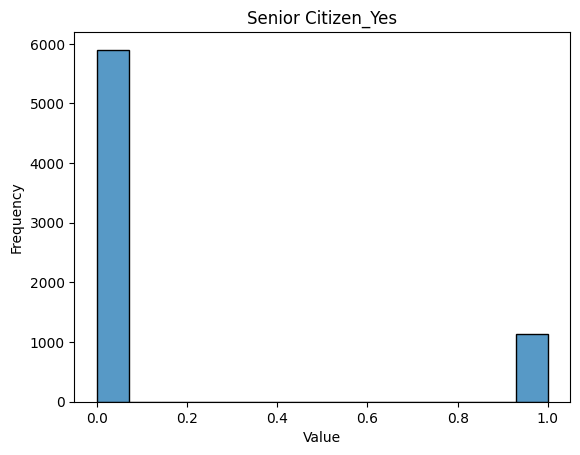

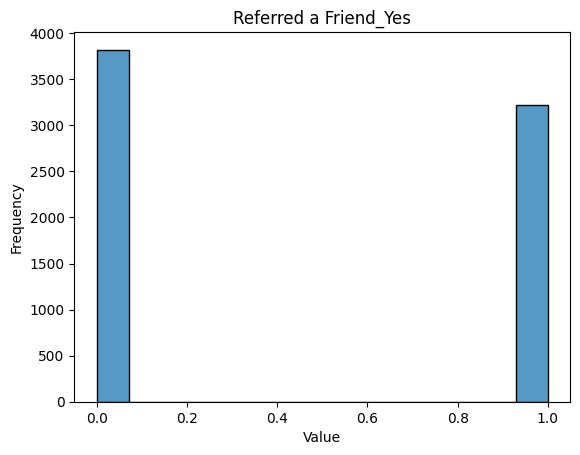

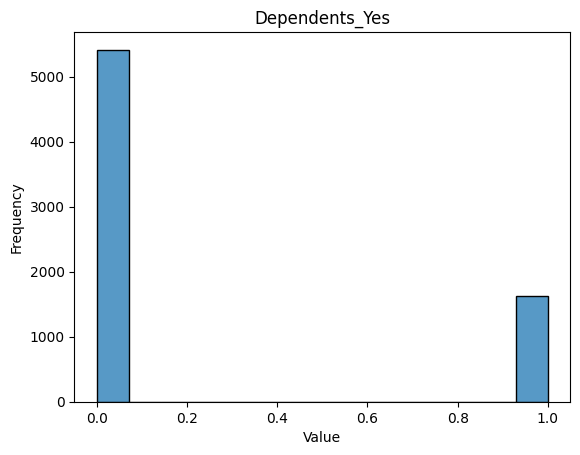

In [12]:
for col in telco3.columns:
    
    sns.histplot(telco3[col], kde=False)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(col)
    plt.savefig(f'bar_chart_{col}.png')
    plt.show()

#### Looking at boxplots to try and identify outliers, which might or might not need to be removed during the pre-processing phase.

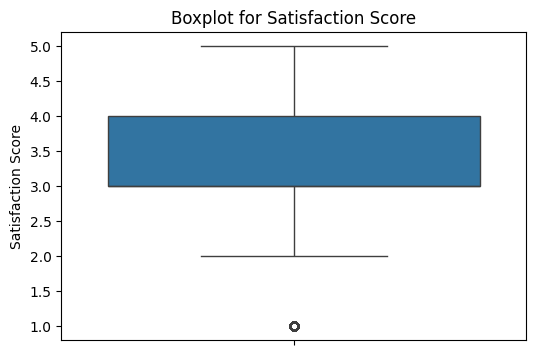

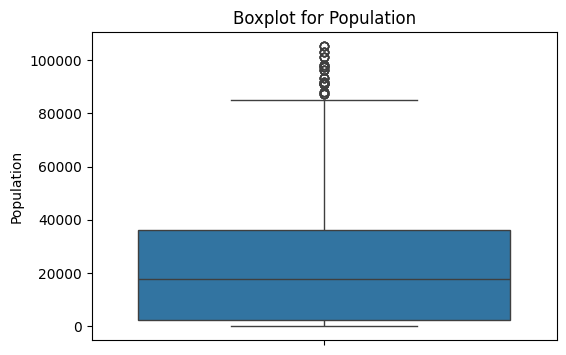

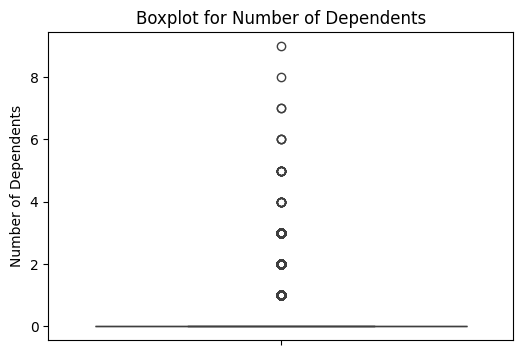

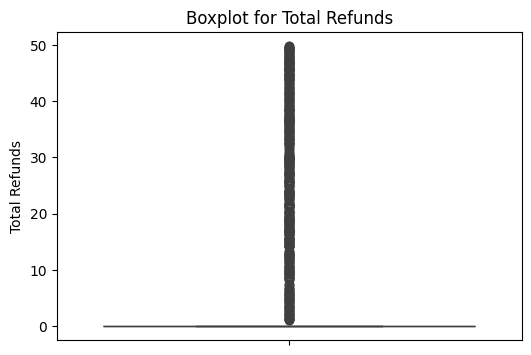

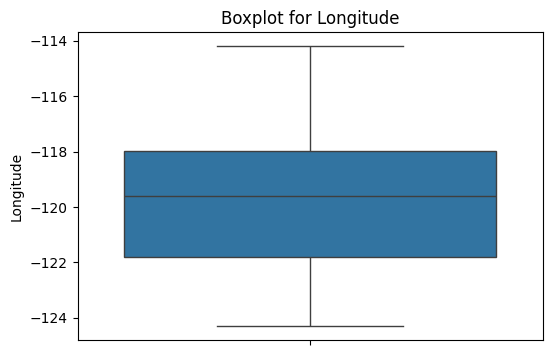

...

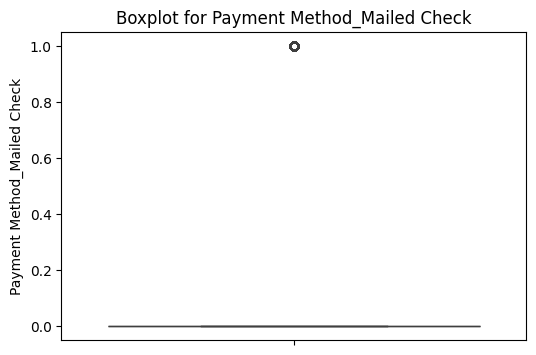

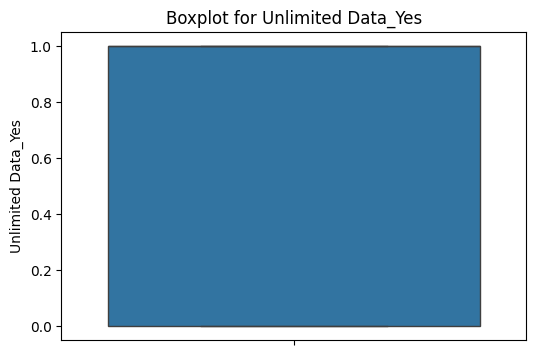

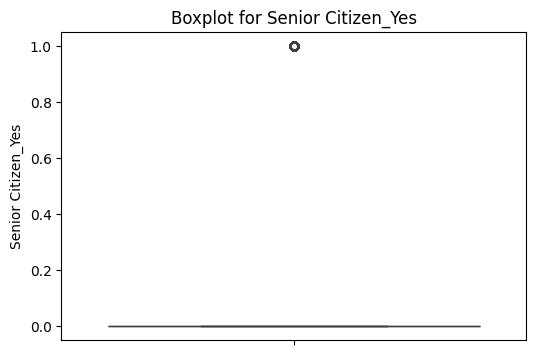

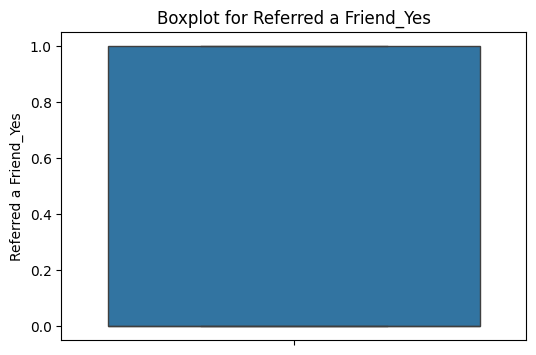

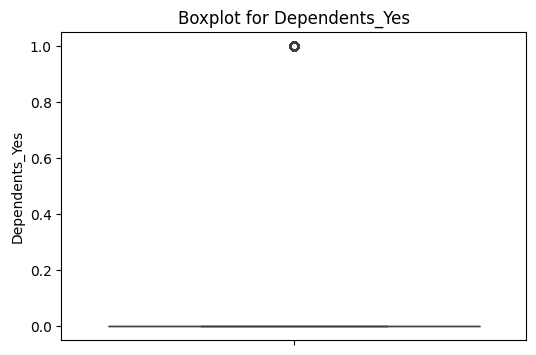

In [13]:
for col in telco3.columns:
    
    plt.figure(figsize = (6, 4))
    sns.boxplot(data = telco3, y = col)
    plt.title(f'Boxplot for {col}')
    plt.savefig(f'boxplot_{col}.png')
    plt.show()
    

#### Looking at a correlation matrix to try and identify important features and multicolinearity. Not a lot of features seem to have strong correlation with the target, but many of them are correlated with other features and might be removed from the dataset.

In [14]:
def custom_corr_matrix(df, file_name):
    
    # Creating correlation matrix
    corr_matrix = df.corr()

    # corr_matrix.abs() gets absolute values
    # .unstack() flattens the matrix
    # .sort_values(ascending=False) sorts from largest absolute correlation to lowest absolute correlation
    sorted_corr = corr_matrix.abs().unstack().sort_values(ascending = False)

    # Removing self-correlations
    sorted_corr = sorted_corr[sorted_corr < 1]

    # sorted_corr is a flat matrix, therefore, it is a list of pairs of features
    # .index gets an index per pair
    # .get_level_values(0) gets the value of one of the features in a pair, in this specific case, the first one.
    # .unique() removes duplicates
    sorted_corr = sorted_corr.index.get_level_values(0).unique()

    # Using sorted_corr to re-create the correlation matrix
    sorted_corr_matrix = df[sorted_corr].corr()

    # Using the correlation matrix to plot a heatmap
    plt.figure(figsize = (25, 20), dpi = 500)
    sns.heatmap(sorted_corr_matrix, annot = True, cmap = "coolwarm", vmin = -1, vmax = 1, fmt = ".1f")

    plt.title('Correlation Matrix')
    plt.savefig(file_name + '.png')
    plt.show()

In [15]:
custom_corr_matrix(telco3, 'First_Correlation_Matrix')

#### Looking at VIF scores, which are very high and will require that a few features be removed from the dataframe.

In [16]:
def vif_scores(df, filename):
    vif_data = pd.DataFrame()
    vif_data['Feature'] = df.columns
    vif_data = vif_data[(vif_data['Feature'] != 'Churn Label_Yes') & (vif_data['Feature'] != 'Churn Score')]
    vif_data = vif_data.reset_index(drop=True)  # Reset the index to avoid gaps
    vif_data['VIF'] = 0

    for i in range(len(vif_data)):
        
        vif_data.loc[i, 'VIF'] = variance_inflation_factor(df[vif_data['Feature']].values, i)
        
    vif_data.sort_values(by=['VIF'], ascending = False, inplace = True)

    vif_data.to_csv(filename + '.csv')
    print(vif_data)

In [17]:
vif_scores(telco3, 'first_VIF')

C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered

                              Feature          VIF
9            Total Extra Data Charges          inf
5                       Total Charges          inf
16        Total Long Distance Charges          inf
17                      Total Revenue          inf
3                       Total Refunds          inf
12                           Zip Code  7267.487039
4                           Longitude  7153.692917
10                           Latitude   488.424395
14                     Monthly Charge    80.781405
26               Internet Service_Yes    47.593648
7                                 Age    35.596095
29                  Phone Service_Yes    27.864963
8                    Tenure in Months    25.724804
0                  Satisfaction Score    21.975591
40              Referred a Friend_Yes    20.940131
22                        Married_Yes    20.581402
38                 Unlimited Data_Yes    18.103270
13                               CLTV    17.810776
25             Customer Status_

#### Looking at the target variable's distribution. There is some imbalance, but not as much as expected given that this is a customer churn dataset. It seems like the company had a very significant proportion of their customers churn during this time period. Both under-sampling and over-sampling will be applied to determine which is more appropriate.

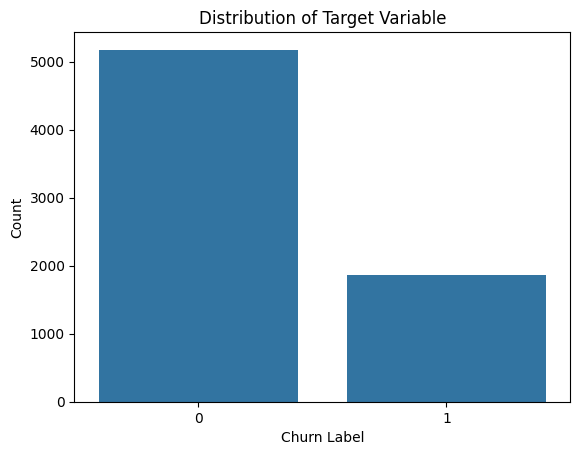

In [18]:
sns.countplot(data = telco3, x = 'Churn Label_Yes')
plt.xlabel('Churn Label')
plt.ylabel('Count')
plt.title('Distribution of Target Variable')
plt.savefig('Target_Distribution.png')
plt.show()

## Pre-Processing

In [19]:
telco3.head()

,Satisfaction Score,Population,Number of Dependents,Total Refunds,Longitude,Total Charges,Avg Monthly GB Download,Churn Score,Age,Tenure in Months,Total Extra Data Charges,Latitude,Avg Monthly Long Distance Charges,Zip Code,CLTV,Monthly Charge,Number of Referrals,Total Long Distance Charges,Total Revenue,Streaming Music_Yes,Under 30_Yes,Paperless Billing_Yes,Multiple Lines_Yes,Married_Yes,Premium Tech Support_Yes,Customer Status_Joined,Customer Status_Stayed,Internet Service_Yes,Device Protection Plan_Yes,Streaming TV_Yes,Phone Service_Yes,Churn Label_Yes,Online Security_Yes,Contract_One Year,Contract_Two Year,Gender_Male,Online Backup_Yes,Streaming Movies_Yes,Payment Method_Credit Card,Payment Method_Mailed Check,Unlimited Data_Yes,Senior Citizen_Yes,Referred a Friend_Yes,Dependents_Yes
0,3,68701,0,0.00,-118.156582,39.65,8,91,78,1,20,34.023810,0.00,90022,5433,39.65,0,0.00,59.65,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0
1,3,55668,1,0.00,-118.185237,633.30,17,69,74,8,0,34.044271,48.85,90063,5302,80.65,1,390.80,1024.10,0,0,1,1,1,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,1,1,1,1
2,2,47534,3,45.61,-118.229715,1752.55,52,81,71,18,0,34.108833,11.33,90065,3179,95.45,0,203.94,1910.88,1,0,1,1,0,0,0,0,1,0,1,1,1,0,0,0,1,0,1,0,0,1,1,0,1
3,2,27778,1,13.43,-118.332639,2514.50,12,88,78,25,0,33.936291,19.76,90303,5337,98.50,1,494.00,2995.07,0,0,1,0,1,0,0,0,1,1,1,1,1,0,0,0,0,1,1,0,0,1,1,1,1
4,2,26265,1,0.00,-118.020188,2868.15,14,67,80,37,0,33.972119,6.33,90602,2793,76.50,1,234.21,3102.36,0,0,1,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,1,1,1


#### All outliers combined amount to slightly over fifteen hundred instances, or almost all churners. For that reason alone, removing all outliers is not desireble. More importantly, about nine hundred of those outliers are customers with low satisfaction scores who churned, which might be a good predictor of churn label. It is also interesting to notice that senior citizens who churned amount to almost five hundred instances alone, or almost a third of all outliers, while customers under thirty who churned amount to about three hundred instances. These two demographics combined accout for a little more than half of all outliers who churned, and a little over half of all customers who churned, indicating that they might be more of a churning predictor than real outliers. There is still part of the outliers between thirty years old and senior that account for the other half of all churners, but it is hard to determine why they churned at this point. In either case, due to the low volume of data and to the high volume of outliers who churned, outliers will be kept in the dataset.

In [20]:
churners = len(telco3[telco3['Churn Label_Yes'] == 1])
no_phone_service = len(telco3[(telco3['Phone Service_Yes'] == 0) & (telco3['Churn Label_Yes'] == 1)])
under_30 = len(telco3[(telco3['Under 30_Yes'] == 1) & (telco3['Churn Label_Yes'] == 1)])
one_year_contract = len(telco3[(telco3['Contract_One Year'] == 1) & (telco3['Churn Label_Yes'] == 1)])
new_customer = len(telco3[(telco3['Customer Status_Joined'] == 1) & (telco3['Churn Label_Yes'] == 1)])
with_dependents = len(telco3[(telco3['Dependents_Yes'] == 1) & (telco3['Churn Label_Yes'] == 1)])
no_internet = len(telco3[(telco3['Internet Service_Yes'] == 0) & (telco3['Churn Label_Yes'] == 1)])
with_dependents_num = len(telco3[(telco3['Number of Dependents'] > 0) & (telco3['Churn Label_Yes'] == 1)])
more_than_seven_referrals = len(telco3[(telco3['Number of Referrals'] > 7) & (telco3['Churn Label_Yes'] == 1)])
mailed_check = len(telco3[(telco3['Payment Method_Mailed Check'] == 1) & (telco3['Churn Label_Yes'] == 1)])
large_population = len(telco3[(telco3['Population'] > 80000) & (telco3['Churn Label_Yes'] == 1)])
senior_citizen = len(telco3[(telco3['Senior Citizen_Yes'] == 1) & (telco3['Churn Label_Yes'] == 1)])
extra_data_charges = len(telco3[(telco3['Total Extra Data Charges'] > 0) & (telco3['Churn Label_Yes'] == 1)])
long_distance_charges = len(telco3[(telco3['Total Long Distance Charges'] > 3000) & (telco3['Churn Label_Yes'] == 1)])
received_refund = len(telco3[(telco3['Total Refunds'] > 0) & (telco3['Churn Label_Yes'] == 1)])
revenue = len(telco3[(telco3['Total Revenue'] > 11000) & (telco3['Churn Label_Yes'] == 1)])
low_satisfaction_score = len(telco3[(telco3['Satisfaction Score'] == 1) & (telco3['Churn Label_Yes'] == 1)])
seniors_low_satisfaction = len(telco3[(telco3['Senior Citizen_Yes'] == 1) & (telco3['Satisfaction Score'] == 1) & (telco3['Churn Label_Yes'] == 1)])
under_30_low_satisfaction = len(telco3[(telco3['Under 30_Yes'] == 1) & (telco3['Satisfaction Score'] == 1) & (telco3['Churn Label_Yes'] == 1)])
seniors_mailed_check = len(telco3[(telco3['Senior Citizen_Yes'] == 1) & (telco3['Payment Method_Mailed Check'] == 1) & (telco3['Churn Label_Yes'] == 1)])
under_30_extra_data_charges = len(telco3[(telco3['Under 30_Yes'] == 1) & (telco3['Total Extra Data Charges'] > 0) & (telco3['Churn Label_Yes'] == 1)])

all_outliers = len(telco3[
    ((telco3['Satisfaction Score'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Phone Service_Yes'] == 0) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Under 30_Yes'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Contract_One Year'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Customer Status_Joined'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Dependents_Yes'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Internet Service_Yes'] == 0) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Number of Dependents'] > 0) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Number of Referrals'] > 7) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Payment Method_Mailed Check'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Population'] > 80000) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Senior Citizen_Yes'] == 1) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Total Extra Data Charges'] > 0) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Total Long Distance Charges'] > 3000) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Total Refunds'] > 0) & (telco3['Churn Label_Yes'] == 1)) |
    ((telco3['Total Revenue'] > 11000) & (telco3['Churn Label_Yes'] == 1))
])

print(
f'''
Low Satisfaction: {low_satisfaction_score}
No Phone Service: {no_phone_service}
Under 30: {under_30}
One Year Contract: {one_year_contract}
New Customer: {new_customer}
With Dependents: {with_dependents}
No Internet Service: {no_internet}
With Dependents (Number): {with_dependents_num}
More Than Seven Referrals: {more_than_seven_referrals}
Mailed Check: {mailed_check}
Large Population: {large_population}
Senior Citizen: {senior_citizen}
Extra Data Charges: {extra_data_charges}
Long Distance Charges: {long_distance_charges}
Received Refund: {received_refund}
Revenue Over 11000: {revenue}
Seniors with Low Satisfaction Score: {seniors_low_satisfaction}
Under 30 with Low Satisfaction Score: {under_30_low_satisfaction}
Seniors with Mailed Check: {seniors_mailed_check}
Under 30 with Extra Data Charges: {under_30_extra_data_charges}
Total Instances Meeting At Least One Condition: {all_outliers}
All Churners: {churners}
'''
)



Low Satisfaction: 922
No Phone Service: 170
Under 30: 304
One Year Contract: 166
New Customer: 0
With Dependents: 106
No Internet Service: 113
With Dependents (Number): 106
More Than Seven Referrals: 6
Mailed Check: 142
Large Population: 14
Senior Citizen: 476
Extra Data Charges: 239
Long Distance Charges: 15
Received Refund: 107
Revenue Over 11000: 3
Seniors with Low Satisfaction Score: 243
Under 30 with Low Satisfaction Score: 164
Seniors with Mailed Check: 13
Under 30 with Extra Data Charges: 36
Total Instances Meeting At Least One Condition: 1576
All Churners: 1869



#### The Tenure in Months feature is a bimodal feature with low and high tenure modes, which is why I decided to make it a dummy variable

In [21]:
telco3['Low Tenure'] = np.where(telco3['Tenure in Months'] <= 37, 0, 1)

telco3.drop(columns = 'Tenure in Months', inplace = True)

telco3['Low Tenure'].head()

0    0
1    0
2    0
3    0
4    0
Name: Low Tenure, dtype: int32

#### Performing feature transformation to try and reduce skew

In [22]:
to_transform = ['Population', 'Total Charges', 'CLTV', 'Monthly Charge', 'Number of Dependents', 'Number of Referrals',
                'Total Extra Data Charges', 'Avg Monthly GB Download']

pt = PowerTransformer(method = 'yeo-johnson')

for col in to_transform:
    
    telco3['power_' + col] = pt.fit_transform(telco3[[col]])
    telco3.drop(columns=[col], inplace = True)
                                  
telco3.columns

Index(['Satisfaction Score', 'Total Refunds', 'Longitude', 'Churn Score',
       'Age', 'Latitude', 'Avg Monthly Long Distance Charges', 'Zip Code',
       'Total Long Distance Charges', 'Total Revenue', 'Streaming Music_Yes',
       'Under 30_Yes', 'Paperless Billing_Yes', 'Multiple Lines_Yes',
       'Married_Yes', 'Premium Tech Support_Yes', 'Customer Status_Joined',
       'Customer Status_Stayed', 'Internet Service_Yes',
       'Device Protection Plan_Yes', 'Streaming TV_Yes', 'Phone Service_Yes',
       'Churn Label_Yes', 'Online Security_Yes', 'Contract_One Year',
       'Contract_Two Year', 'Gender_Male', 'Online Backup_Yes',
       'Streaming Movies_Yes', 'Payment Method_Credit Card',
       'Payment Method_Mailed Check', 'Unlimited Data_Yes',
       'Senior Citizen_Yes', 'Referred a Friend_Yes', 'Dependents_Yes',
       'Low Tenure', 'power_Population', 'power_Total Charges', 'power_CLTV',
       'power_Monthly Charge', 'power_Number of Dependents',
       'power_Number of Re

#### Distributions are not exactly normal. There are still some bimodal distributions. Population, Total Charges and CLTV (maybe even Monthly Charge) are exhibiting bimodal behavior, which requires further investigation an potentially replacing these features with binary ones. Number of dependents is redundant and can be removed, seeing that there is a discretized version of this feature already (Dependents). Number of referrals, Total Extra data Charges and Avg Monthly GB Download might need to be discretized as well.

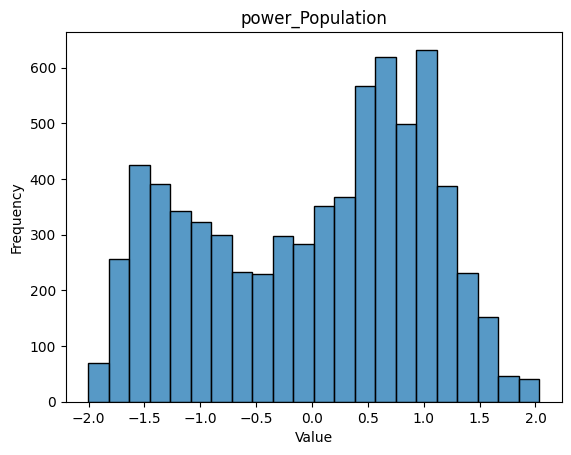

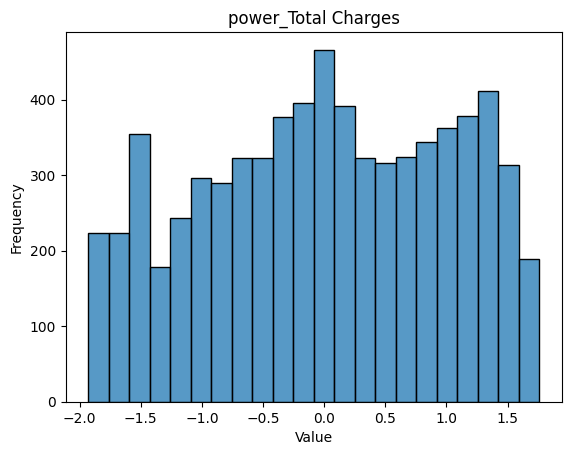

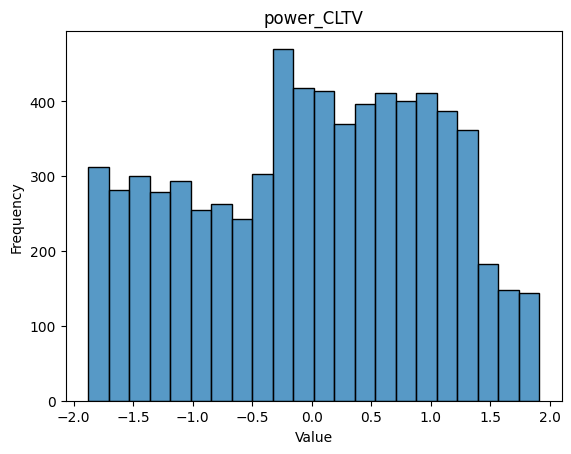

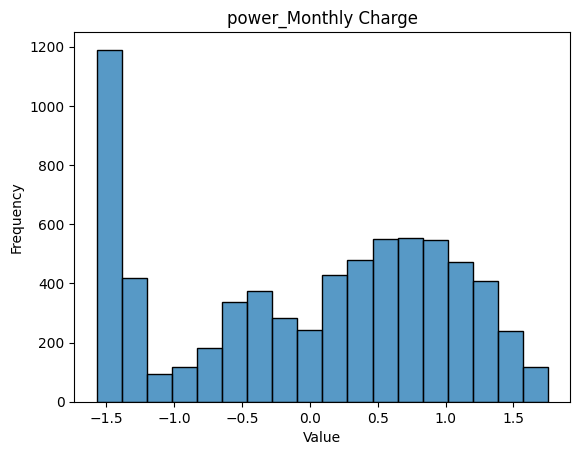

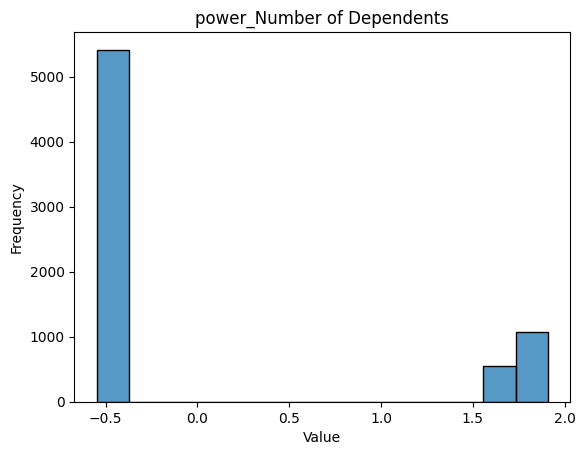

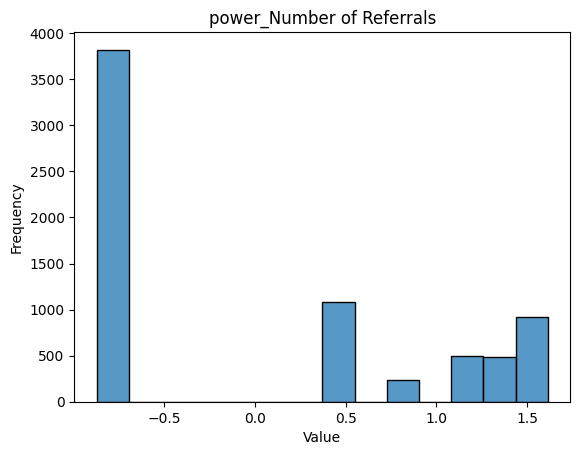

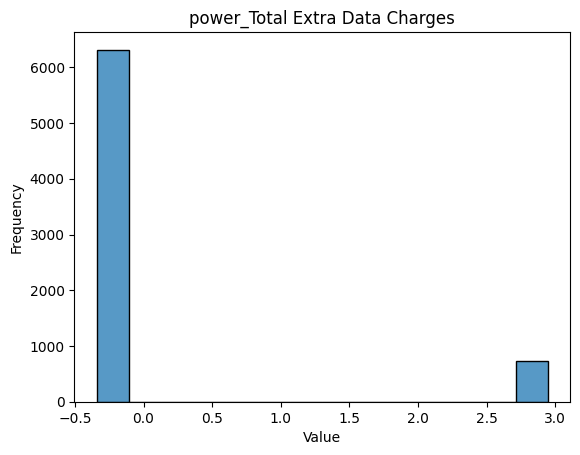

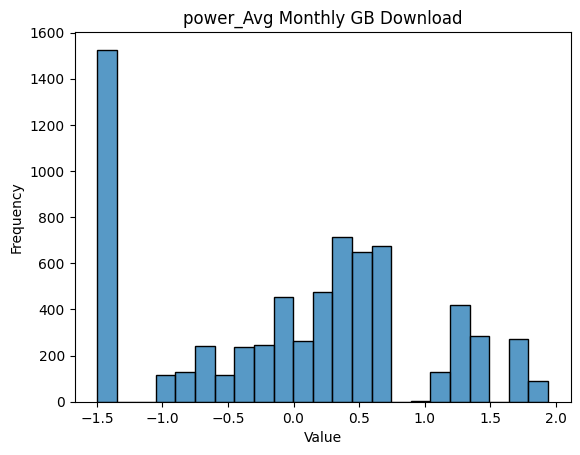

In [23]:
for col in to_transform:
    
    col = 'power_' + col
    
    sns.histplot(telco3[col], kde=False)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(col)
    plt.savefig(f'new_bar_chart_{col}.png')
    plt.show()

#### Discretizing features

In [24]:
# The new "Population" feature receives 0 for "small population" and 1 for "large population"
telco3['Small Population'] = np.where(telco3['power_Population'] <= -0.5, 0, 1)

# Setting conditions so that High Total Charges is implicit.
telco3['Low Total Charges'] = np.where(telco3['power_Total Charges'] <= -1.4, 1, 0)
telco3['Average Total Charges'] = np.where((telco3['power_Total Charges'] > -1.4) & (telco3['power_Total Charges'] <= 0.6),
                                           1, 0)

telco3['Low CLTV'] = np.where(telco3['power_CLTV'] <= -0.5, 0, 1)

# Setting conditions so that High Monthly Charge is implicit.
telco3['Low Monthly Charges'] = np.where(telco3['power_Monthly Charge'] <= -1, 1, 0)
telco3['Average Monthly Charges'] = np.where((telco3['power_Monthly Charge'] > -1) & (telco3['power_Monthly Charge'] <= 0),
                                           1, 0)

# Discretizing the last few features
telco3['No Referrals'] = np.where(telco3['power_Number of Referrals'] < 0, 0, 1)
telco3['No Extra Data Charges'] = np.where(telco3['power_Total Extra Data Charges'] < 0, 0, 1)
telco3['No Downloads'] = np.where(telco3['power_Avg Monthly GB Download'] < -1.25, 0, 1)

#### Looking at the distribution for the newly discretized features

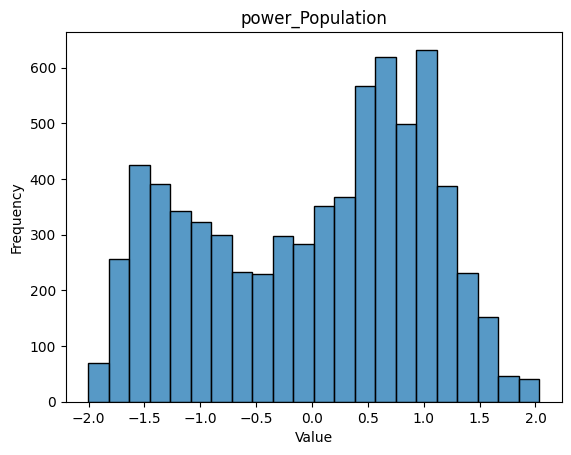

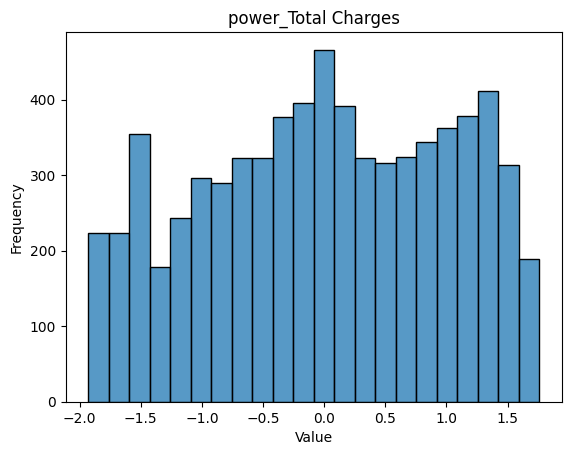

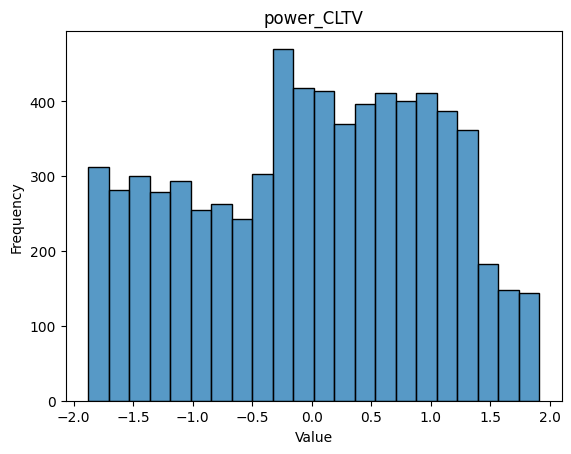

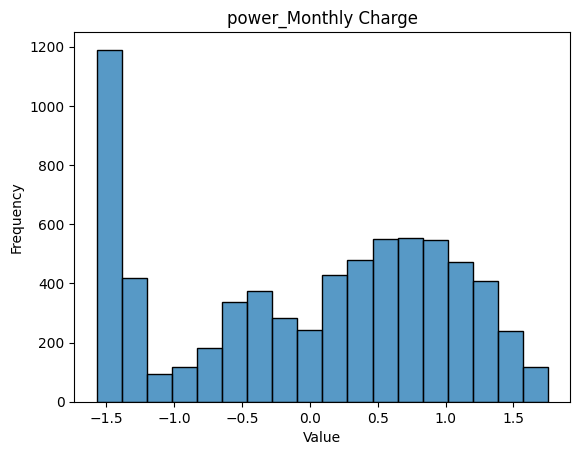

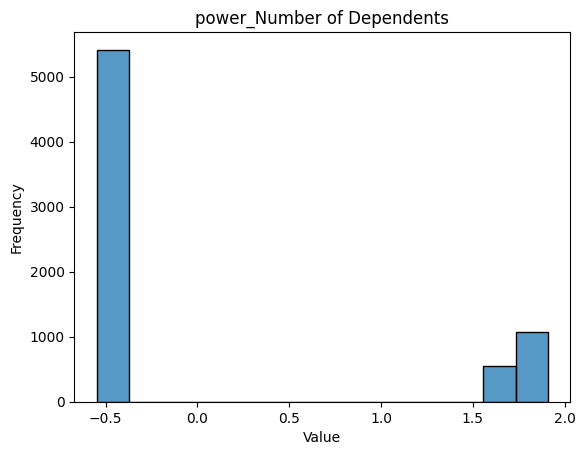

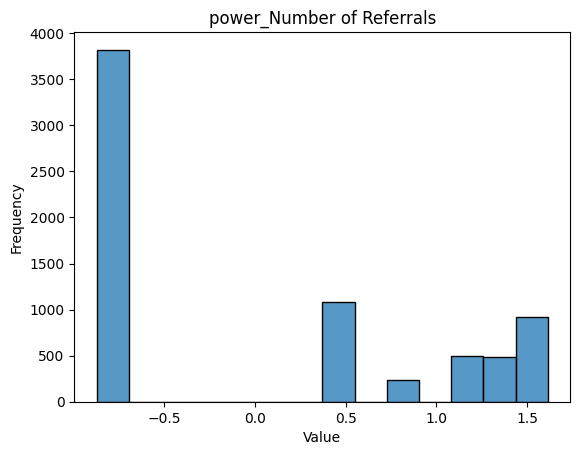

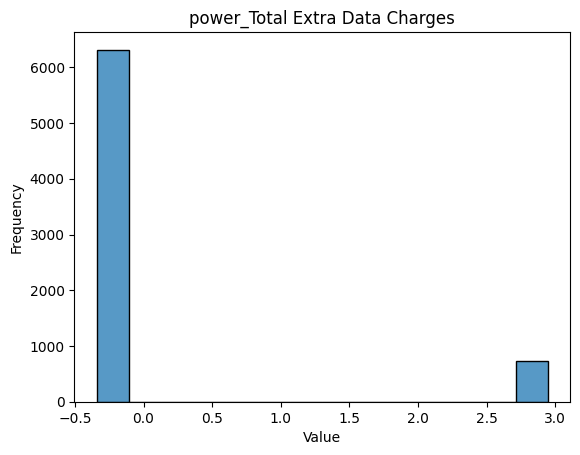

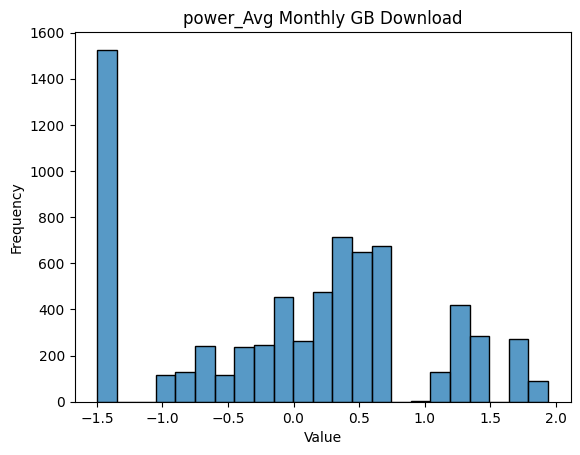

In [25]:
for col in to_transform:
    
    col = 'power_' + col
    
    sns.histplot(telco3[col], kde=False)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(col)
    plt.savefig(f'last_bar_chart_{col}.png')
    plt.show()

#### Dropping columns.

In [26]:
telco3.drop(columns = ['power_Population',
                       'power_Total Charges',
                       'power_CLTV',
                       'power_Monthly Charge',
                       'power_Number of Dependents',
                       'power_Number of Referrals',
                       'power_Total Extra Data Charges',
                       'power_Avg Monthly GB Download'], inplace = True)


#### Looking at the scaled dataframe

In [27]:
minmax_scaler = MinMaxScaler()
telco4 = minmax_scaler.fit_transform(telco3)
telco4 = pd.DataFrame(telco4, columns = telco3.columns)

telco4.head()

,Satisfaction Score,Total Refunds,Longitude,Churn Score,Age,Latitude,Avg Monthly Long Distance Charges,Zip Code,Total Long Distance Charges,Total Revenue,Streaming Music_Yes,Under 30_Yes,Paperless Billing_Yes,Multiple Lines_Yes,Married_Yes,Premium Tech Support_Yes,Customer Status_Joined,Customer Status_Stayed,Internet Service_Yes,Device Protection Plan_Yes,Streaming TV_Yes,Phone Service_Yes,Churn Label_Yes,Online Security_Yes,Contract_One Year,Contract_Two Year,Gender_Male,Online Backup_Yes,Streaming Movies_Yes,Payment Method_Credit Card,Payment Method_Mailed Check,Unlimited Data_Yes,Senior Citizen_Yes,Referred a Friend_Yes,Dependents_Yes,Low Tenure,Small Population,Low Total Charges,Average Total Charges,Low CLTV,Low Monthly Charges,Average Monthly Charges,No Referrals,No Extra Data Charges,No Downloads
0,0.50,0.000000,0.607885,0.945055,0.967213,0.156064,0.000000,0.003415,0.000000,0.003202,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
1,0.50,0.000000,0.605050,0.703297,0.901639,0.158239,0.977195,0.010083,0.109630,0.083855,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
2,0.25,0.916047,0.600650,0.835165,0.852459,0.165103,0.226645,0.010408,0.057211,0.158013,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.25,0.269733,0.590468,0.912088,0.967213,0.146759,0.395279,0.049114,0.138580,0.248680,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
4,0.25,0.000000,0.621378,0.681319,1.000000,0.150568,0.126625,0.097739,0.065702,0.257652,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


#### Looking at descriptive statistics for the scaled dataframe.

In [29]:
telco4.describe().T.to_csv('Scaled_Descriptive_Statistics.csv')

telco4.describe()

,Satisfaction Score,Total Refunds,Longitude,Churn Score,Age,Latitude,Avg Monthly Long Distance Charges,Zip Code,Total Long Distance Charges,Total Revenue,Streaming Music_Yes,Under 30_Yes,Paperless Billing_Yes,Multiple Lines_Yes,Married_Yes,Premium Tech Support_Yes,Customer Status_Joined,Customer Status_Stayed,Internet Service_Yes,Device Protection Plan_Yes,Streaming TV_Yes,Phone Service_Yes,Churn Label_Yes,Online Security_Yes,Contract_One Year,Contract_Two Year,Gender_Male,Online Backup_Yes,Streaming Movies_Yes,Payment Method_Credit Card,Payment Method_Mailed Check,Unlimited Data_Yes,Senior Citizen_Yes,Referred a Friend_Yes,Dependents_Yes,Low Tenure,Small Population,Low Total Charges,Average Total Charges,Low CLTV,Low Monthly Charges,Average Monthly Charges,No Referrals,No Extra Data Charges,No Downloads
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.561231,0.039409,0.449592,0.587967,0.450979,0.387148,0.459271,0.566770,0.210143,0.251967,0.353259,0.198921,0.592219,0.421837,0.483033,0.290217,0.064461,0.670169,0.783331,0.343888,0.384353,0.903166,0.265370,0.286668,0.220077,0.267358,0.504756,0.344881,0.387903,0.390317,0.054664,0.673719,0.162147,0.457476,0.231010,0.416868,0.659236,0.117422,0.555871,0.683800,0.243646,0.193242,0.457476,0.103365,0.783331
std,0.300414,0.158719,0.213131,0.232638,0.274596,0.262476,0.309024,0.301963,0.237511,0.239606,0.478016,0.399217,0.491457,0.493888,0.499748,0.453895,0.245590,0.470185,0.412004,0.475038,0.486477,0.295752,0.441561,0.452237,0.414328,0.442612,0.500013,0.475363,0.487307,0.487856,0.227340,0.468885,0.368612,0.498224,0.421508,0.493076,0.474000,0.321945,0.496904,0.465025,0.429312,0.394869,0.498224,0.304457,0.412004
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.500000,0.000000,0.248631,0.384615,0.213115,0.152538,0.184237,0.341519,0.019790,0.048859,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.500000,0.000000,0.465558,0.615385,0.442623,0.387999,0.457892,0.571963,0.112615,0.174551,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.750000,0.000000,0.626363,0.774725,0.672131,0.595930,0.728046,0.866482,0.334136,0.399715,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000

#### Looking at a correlation matrix for the updated dataframe

In [30]:
custom_corr_matrix(telco4, 'Second_Correlation_Matrix')

#### VIF scores seem to have improved, in general. Particularly significant improvements happened for the Total Charges, Zip Code, Longitude, Latitude and Monthly Charge features. The two charge related features have been transformed and discretized prior to being scaled. There were also a few VIF scores which got worse, namely Internet Service_Yes, Referred a Friend_Yes and Unlimited Data_Yes. Overall, there are still features which need to be addressed. Based on the VIF scores and on the correlation matrix, these are the features that should be removed from the dataframe: No Downloads, Referred a Friend_Yes, No Referrals, Latitude, Longitude, Total Long Distance Charges, Low Monthly Charges, Streaming Music_Yes, Low Tenure, Senior Citizen_Yes and Under 30_Yes. Churn Score is a probability of a given customer churning, calculated by IBM, and should be removed for the intent and purposes of this project. Likewise, Customer Status Stayed is measuring whether a given customer stayed at the end of the quarter, therefore there obviously is a strong correlation between that feature and the Churn Label. More than that, this feature can only be measured once it is known that a given customer did not churn and will, therefore, have to be removed as well.

In [31]:
vif_scores(telco4, 'second_VIF')

C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
C:\Users\lucas\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


PermissionError: [Errno 13] Permission denied: 'second_VIF.csv'

#### Removing features.

In [ ]:
# Creating telco4_rf or, telco4_removedfeatures
telco4_rf = telco4.drop(columns = ['No Downloads',
                                   'Referred a Friend_Yes',
                                   'No Referrals',
                                   'Latitude',
                                   'Longitude',
                                   'Total Long Distance Charges',
                                   'Low Monthly Charges',
                                   'Streaming Music_Yes',
                                   'Low Tenure',
                                   'Senior Citizen_Yes',
                                   'Under 30_Yes',
                                   'Churn Score',
                                   'Customer Status_Stayed'])

#### Looking at the correlation matrix after removing features to see how it changed.

In [ ]:
custom_corr_matrix(telco4_rf, 'Third_Correlation_Matrix')

#### Based on the correlation matrix and on the VIF scores, Unlimited Data_Yes and Average Total Charges need to be removed.

In [ ]:
vif_scores(telco4_rf, 'third_VIF')

#### Dropping columns and looking at VIF scores

In [ ]:
telco4_rf.drop(columns = ['Unlimited Data_Yes', 'Average Total Charges'], inplace = True)

vif_scores(telco4_rf, 'fourth_VIF')

#### Looking at the correlation matrix for updates. Considering that both XGBoost classifier and Dense Neural Network (DNN) classifier are robust to multicolinearity, moderate VIF scores (10 to 12) should not be an issue and, therefore, these variables are a good start for training. Although, based on correlation solely, I would expect the Satisfaction Score feature to do most of the lifting.

In [ ]:
custom_corr_matrix(telco4_rf, 'Fourth_Correlation_Matrix')

#### For feature selection, Recursive Feature Elimination, SelectFromModel (Using a Random Forest Classifier) and Mutual Information will be used with the goal of making sure feature selection is robust.
#### Recursive Feature Elimination (RFE)

In [32]:
def rfe_feat_select(df, n_features = 10):
    
    # Splitting into features and target
    x = df.drop(columns = 'Churn Label_Yes')
    y = df['Churn Label_Yes']

    # Initializing the estimator
    model = RandomForestClassifier(n_estimators = 100, random_state = 42)

    # Initializing RFE with the model and specify the number of features to select
    rfe = RFE(estimator = model, n_features_to_select = n_features) 

    # Fitting RFE to the data
    rfe.fit(x, y)

    # Getting the selected features
    selected_features = x.columns[rfe.support_].tolist()
    print(f'Selected Features by RFE: {selected_features}')

    # View RFE rankings of all features
    feature_ranking = pd.DataFrame({'Feature': x.columns, 'Ranking': rfe.ranking_})
    print(f'Feature Ranking: {feature_ranking.sort_values(by="Ranking")}')
    
    return selected_features


In [33]:
features1 = rfe_feat_select(telco4_rf)

NameError: name 'telco4_rf' is not defined

#### SelectFromModel

In [ ]:
def sfm_feat_select(df):
    
    # Splitting into features and target
    x = df.drop(columns='Churn Label_Yes')
    y = df['Churn Label_Yes']

    # Initializing the model
    model = RandomForestClassifier(n_estimators = 100, random_state = 42)

    # Fitting the model
    model.fit(x, y)

    # Initializing SelectFromModel with the model and specifying a threshold
    sfm = SelectFromModel(estimator = model, threshold = 'mean')

    # Fitting SelectFromModel to the data
    sfm.fit(x, y)

    # Getting the selected features
    selected_features = x.columns[sfm.get_support()].tolist()
    print(f'Selected Features by SelectFromModel: {selected_features}')

    # Getting feature importance scores for reference
    feature_importances = pd.DataFrame({'Feature': x.columns, 'Importance': model.feature_importances_})
    print(f"Feature Importances: {feature_importances.sort_values(by = 'Importance', ascending=False)}")
    
    return selected_features

In [ ]:
features2 = sfm_feat_select(telco4_rf)

#### Mutual Information

In [ ]:
def mi_feat_select(df, n_features = 10):
    
    # Splitting into features and target
    x = df.drop(columns='Churn Label_Yes')
    y = df['Churn Label_Yes']

    # Initialize SelectKBest for mutual information
    selector = SelectKBest(score_func=mutual_info_classif, k = n_features)
    selector.fit(x, y)  # fitting the selector

    # Getting the selected feature names and their scores
    selected_features = x.columns[selector.get_support()]
    feature_scores = selector.scores_[selector.get_support()]
    selected_df = pd.DataFrame({'Feature': selected_features, 'Score': feature_scores})

    print("Selected Features by Mutual Information:\n", selected_df.sort_values(by="Score", ascending=False))

    return selected_features.tolist()

In [ ]:
features3 = mi_feat_select(telco4_rf)

#### Creating a dataframe with features selected by all methods and counts of by how many methods they were selected. Any feature selected by any of the methods employed will be kept in the dataframe. The features selected were 12 and can be seen below.

In [ ]:
# Creating a list of all features
features = telco4_rf.columns.tolist()

# Creating a dictionary with feature for keys and 0 for values
feature_counts = {feature: 0 for feature in features}

# For each feature in the list of all features
for feature in features:
    
    # If they have been selected by a given feature selection method, add to their count
    if feature in features1:
        
        feature_counts[feature] += 1
        
    if feature in features2:
        
        feature_counts[feature] += 1
        
    if feature in features3:
        
        feature_counts[feature] += 1
        
# Creating a dataframe with features and how many times they were selected
df_counts = pd.DataFrame(list(feature_counts.items()), columns=['Feature', 'Count'])

# Sorting by count
df_counts.sort_values(by='Count', ascending = False, ignore_index = True, inplace = True)

# Filtering out features that were not selected
df_counts = df_counts[df_counts['Count'] > 0]

# Looking at it
df_counts

#### Creating a list of the selected features to remove the others from the dataframe.

In [ ]:
STOP
features_selected = df_counts['Feature'].tolist()

features_selected.append('Churn Label_Yes')

features_selected

#### Performing under-sampling

In [ ]:
def undersampling(df):
    
    # Separating the classes
    majority_class = df[df['Churn Label_Yes'] == 0]
    minority_class = df[df['Churn Label_Yes'] == 1]

    # Randomly sampling from the majority class to match the minority class size
    undersampled_majority = majority_class.sample(len(minority_class), random_state=42)

    # Combining the undersampled majority class with the minority class
    undersampled_telco = pd.concat([undersampled_majority, minority_class])

    # Shuffling the dataset
    undersampled_telco = undersampled_telco.sample(frac = 1, random_state = 42).reset_index(drop = True)
    
    return undersampled_telco

In [ ]:
telco5_under = undersampling(telco4_rf)

#### Looking at the target variable's new distribution

In [ ]:
def barchart(df, filename):
    
    sns.countplot(data = df, x = 'Churn Label_Yes')
    plt.xlabel('Churn Label')
    plt.ylabel('Count')
    plt.title('Distribution of Target Variable')
    plt.savefig(filename + '.png')
    plt.show()

In [ ]:
barchart(telco5_under, 'Target_Distribution_Under-Sampled')

#### Performing over-sampling using SMOTE

In [ ]:
def oversampling(df):
    
    # Splitting dataframe
    x = df.drop(columns = 'Churn Label_Yes')
    y = df['Churn Label_Yes']

    # Initializing SMOTE
    smote = SMOTE(random_state = 42)

    # Applying SMOTE to generate synthetic samples for the minority class
    x_resampled, y_resampled = smote.fit_resample(x, y)

    # Combining back into a dataframe
    oversampled_df = pd.concat([pd.DataFrame(x_resampled), pd.DataFrame(y_resampled, columns=['Churn Label_Yes'])], axis=1)
    
    return oversampled_df

In [ ]:
telco5_over = oversampling(telco4_rf)

#### Looking at the target variable's new distribution with over-sampling

In [ ]:
barchart(telco5_under, 'Target_Distribution_Over-Sampled')

#### Creating dataframes (both under and over sampled) with only the selected features

In [ ]:
telco5_under_fs = telco5_under[features_selected]
telco5_over_fs = telco5_over[features_selected]

## Training and evaluating models

#### Creating Dense Neural Network (DNN) class

In [ ]:
class DNN(nn.Module):
    
    def __init__(self, input_dim, first_layer_neurons=128):
        super(DNN, self).__init__()
        
        # Calculating neurons for each layer
        self.hidden1_neurons = first_layer_neurons
        self.hidden2_neurons = first_layer_neurons // 2
        self.hidden3_neurons = self.hidden2_neurons // 2
        
        # Defining layers with batch normalization
        self.hidden1 = nn.Linear(input_dim, self.hidden1_neurons)
        self.bn1 = nn.BatchNorm1d(self.hidden1_neurons)
        
        self.hidden2 = nn.Linear(self.hidden1_neurons, self.hidden2_neurons)
        self.bn2 = nn.BatchNorm1d(self.hidden2_neurons)
        
        self.hidden3 = nn.Linear(self.hidden2_neurons, self.hidden3_neurons)
        self.bn3 = nn.BatchNorm1d(self.hidden3_neurons)
        
        self.output = nn.Linear(self.hidden3_neurons, 1)

    def forward(self, x):
        
        x = torch.relu(self.bn1(self.hidden1(x)))
        x = torch.relu(self.bn2(self.hidden2(x)))
        x = torch.relu(self.bn3(self.hidden3(x)))
        x = torch.sigmoid(self.output(x))
        
        return x


#### Creating function to evaluate either XGBoost or DNN classifier using Distribution Optimally Balanced Stratified Cross-Validation, which should guarantee balanced distribution for the folds.

In [ ]:
def dobscv_evaluation(data, target_col, model_type = 'xgboost', n_splits = 5, random_state = 42,
                      xgb_learning_rate = 0.1, n_estimators = 100, max_depth = 3,
                      epochs = 20, learning_rate = 0.001, batch_size = 32):
    
    # Preparing features and target
    x = data.drop(columns = target_col).values
    y = data[target_col].values

    # Initializing Stratified K-Folds
    skf = StratifiedKFold(n_splits = n_splits, shuffle = True, random_state = random_state)

    # Storing performance metrics for each fold
    accuracies = []
    auc_scores = []
    f1_scores = []
    precisions = []
    recalls = []
    confusion_matrices = []

    # Checking if model_type is xgboost
    if model_type == 'xgboost':
        
        for train_index, test_index in skf.split(x, y):
            
            # Splitting data for a given fold
            x_train, x_test = x[train_index], x[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Initializing XGBoost model using logloss for the evaluation metric because the target
            # has been balanced. Otherwise, AUC would be used.
            model = xgb.XGBClassifier(use_label_encoder = False, eval_metric = 'logloss',
                                      eta = xgb_learning_rate, n_estimators = n_estimators, max_depth = max_depth)
            
            model.fit(x_train, y_train)

            # Making predictions and evaluating them
            y_pred = model.predict(x_test)
            y_pred_proba = model.predict_proba(x_test)[:, 1]
            accuracy = accuracy_score(y_test, y_pred)
            auc = roc_auc_score(y_test, y_pred_proba)
            f1 = f1_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            conf_matrix = confusion_matrix(y_test, y_pred)

            # Storing metrics
            accuracies.append(accuracy)
            auc_scores.append(auc)
            f1_scores.append(f1)
            precisions.append(precision)
            recalls.append(recall)
            confusion_matrices.append(conf_matrix)

    # Otherwise, checks if model type is Dense Neural Networks
    elif model_type == 'dnn':
        
        # Runs on GPU if available, and on CPU otherwise
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        for train_index, test_index in skf.split(x, y):
            
            # Splitting data for a given fold
            x_train, x_test = x[train_index], x[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Converting to torch tensors
            x_train_tensor = torch.tensor(x_train, dtype = torch.float32).to(device)
            y_train_tensor = torch.tensor(y_train, dtype = torch.float32).view(-1, 1).to(device)
            x_test_tensor = torch.tensor(x_test, dtype = torch.float32).to(device)
            y_test_tensor = torch.tensor(y_test, dtype = torch.float32).view(-1, 1).to(device)

            # Creating DataLoader for mini-batch processing
            train_data = TensorDataset(x_train_tensor, y_train_tensor)
            train_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True, drop_last = True)
            
            # Initializing DNN model, loss function, and optimizer
            model = DNN(input_dim = x_train.shape[1]).to(device)
            criterion = nn.BCELoss()
            optimizer = optim.Adam(model.parameters(), lr = learning_rate)

            # Training
            for epoch in range(epochs):
                
                model.train() # Puts model in training mode
                
                for batch_x, batch_y in train_loader:
                
                    batch_x, batch_y = batch_x.to(device), batch_y.to(device) # Creates mini-batches
                    optimizer.zero_grad() # Clears old gradients from the previous training step
                    output = model(batch_x) # Stores output
                    loss = criterion(output, batch_y) # Calculates and stores loss
                    loss.backward() # Backpropagates the error to calculate the gradient of the loss with respect to each parameter.
                    optimizer.step() # Updates the model’s parameters using the gradients calculated in loss.backward()

            # Evaluating
            model.eval() # Puts model in evaluation mode
            with torch.no_grad(): # Disabling gradient calculation to save memory
                y_pred_proba = model(x_test_tensor).cpu().numpy().flatten() # Passes x_test_tensor through the model to get predictions
                y_pred = (y_pred_proba >= 0.5).astype(int) # Converts probabilities greater than or equal to 0.5 to True(1)

            # Calculating metrics
            accuracy = accuracy_score(y_test, y_pred)
            auc = roc_auc_score(y_test, y_pred_proba)
            f1 = f1_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            conf_matrix = confusion_matrix(y_test, y_pred)

            # Storing metrics
            accuracies.append(accuracy)
            auc_scores.append(auc)
            f1_scores.append(f1)
            precisions.append(precision)
            recalls.append(recall)
            confusion_matrices.append(conf_matrix)

    # Aggregating results
    results = {
        'Average Accuracy': np.mean(accuracies),
        'Average AUC': np.mean(auc_scores),
        'Average F1 Score': np.mean(f1_scores),
        'Average Precision': np.mean(precisions),
        'Average Recall': np.mean(recalls),
        'All Accuracies': accuracies,
        'All AUC Scores': auc_scores,
        'All F1 Scores': f1_scores,
        'All Precisions': precisions,
        'All Recalls': recalls,
        'Confusion Matrices': confusion_matrices
    }
    
    # Outputting results
    print('Cross-Validation Results:')
    print(f'Average Accuracy: {results["Average Accuracy"]:.4f}')
    print(f'Average AUC: {results["Average AUC"]:.4f}')
    print(f'Average F1 Score: {results["Average F1 Score"]:.4f}')
    print(f'Average Precision: {results["Average Precision"]:.4f}')
    print(f'Average Recall: {results["Average Recall"]:.4f}')
    print(f'Accuracies per Fold: {results["All Accuracies"]}')
    print(f'AUC Scores per Fold: {results["All AUC Scores"]}')
    print(f'F1 Scores per Fold: {results["All F1 Scores"]}')
    print(f'Precisions per Fold: {results["All Precisions"]}')
    print(f'Recalls per Fold: {results["All Recalls"]}')
    print('Confusion Matrices per Fold:')

    for i, cm in enumerate(results['Confusion Matrices']):
        print(f'Fold {i+1} Confusion Matrix:\n{cm}\n')
    
    return results


#### Creating search grid function. Grid search was chosen both because the dataset is small enough for it, and because this will make the discrepancy between run times for each model more evident, not to mention thorough hyper parameter tuning, of course. While this might not be practical when working with real life dataframes, it helps investigating the advantages and disadvantages of both XGBoost and DNN classifiers when it comes to Customer Churn.

In [ ]:
def search_grid(data, target_col, model_type, eval_func, **param_grid):

    # Creating a list to store results and creating all parameter combinations for the grid search
    results = []
    param_combinations = list(itertools.product(*param_grid.values()))

    # Starting a counter to assist with tracking progress for the model
    counter = 0
    
    # For each parameter combination
    for params in param_combinations:
        
        # Creating a dictionary organized with key values for each combination rather than key and all its possible values
        param_dict = dict(zip(param_grid.keys(), params))

        # Ensuring n_splits is handled as part of the parameters
        n_splits = param_dict.get('n_splits', 5)  # Default to 5 if not provided

        if model_type == 'xgboost':
            
            # Getting parameters for the xgb classifier
            xgb_params = {
                'xgb_learning_rate': param_dict.get('xgb_learning_rate'),
                'n_estimators': param_dict.get('n_estimators'),
                'max_depth': param_dict.get('max_depth')
            }
            
            # Printing parameters, calling evaluation function, calculating run time,updating and printing counter
            print(f'Evaluating with parameters: {xgb_params}, n_splits: {n_splits}')
            start_time = time()
            
            result = eval_func(data, target_col, model_type='xgboost', 
                               n_splits=n_splits, **xgb_params)
            end_time = time()
            time_elapsed = end_time - start_time
            results.append((xgb_params, n_splits, time_elapsed, result))
            
            counter += 1
            print(f'{counter}/480 completed.')

        # If model of choice is dnn rather than xgboost
        elif model_type == 'dnn':
            
            # Gets parameters for dnn model
            dnn_params = {
                'epochs': param_dict.get('epochs'),
                'learning_rate': param_dict.get('learning_rate'),
                'batch_size': param_dict.get('batch_size')
            }
            
            # Printing parameters, calling evaluation function, calculating run time,updating and printing counter
            print(f'Evaluating with parameters: {dnn_params}, n_splits: {n_splits}')
            start_time = time()

            result = eval_func(data, target_col, model_type='dnn', 
                               n_splits=n_splits, **dnn_params)
            end_time = time()
            time_elapsed = end_time - start_time
            results.append((dnn_params, n_splits, time_elapsed, result))
            
            counter += 1
            print(f'{counter}/216 completed.')

        # Printing total time taken for a given model
        print(f'Time taken: {time_elapsed:.2f} seconds\n')
        
    # Returning results
    return results


#### Creating grids for each model

In [ ]:
cv_folds = (5, 6, 7, 8, 9, 10)

xgb_learning_rate = (0.1, 0.01, 0.001, 0.0001)
n_estimators = (100, 200, 300, 400, 500)
max_depth = (3, 4, 5, 6)

epochs = (25, 50, 75, 100)
learning_rate = (0.001, 0.0001, 0.00001)
batch_size = (64, 32, 16)


#### Training and evaluating each model and storing their results as well as run times

In [ ]:
start_time = time()

results_xgb_under = search_grid(
    data=telco5_under_fs, 
    target_col='Churn Label_Yes', 
    model_type='xgboost', 
    eval_func=dobscv_evaluation,
    n_splits=cv_folds,
    xgb_learning_rate=xgb_learning_rate,
    n_estimators=n_estimators,
    max_depth=max_depth
)

end_time = time()
time_elapsed = end_time - start_time
print(f'Time elapsed for XGBoost Classifier: {time_elapsed}')

In [ ]:
start_time = time()

results_xgb_over = search_grid(
    data=telco5_over_fs, 
    target_col='Churn Label_Yes', 
    model_type='xgboost', 
    eval_func=dobscv_evaluation,
    n_splits=cv_folds,
    xgb_learning_rate=xgb_learning_rate,
    n_estimators=n_estimators,
    max_depth=max_depth
)

end_time = time()
time_elapsed = end_time - start_time
print(f'Time elapsed for XGBoost Classifier: {time_elapsed}')

In [ ]:
start_time = time()

results_dnn_under = search_grid(
    data=telco5_under_fs, 
    target_col='Churn Label_Yes', 
    model_type='dnn', 
    eval_func=dobscv_evaluation,
    n_splits=cv_folds,
    epochs=epochs,
    learning_rate=learning_rate,
    batch_size=batch_size
)

end_time = time()
time_elapsed = end_time - start_time
print(f'Time elapsed for DNN Classifier: {time_elapsed}')

In [ ]:
start_time = time()

results_dnn_over = search_grid(
    data=telco5_over_fs, 
    target_col='Churn Label_Yes', 
    model_type='dnn', 
    eval_func=dobscv_evaluation,
    n_splits=cv_folds,
    epochs=epochs,
    learning_rate=learning_rate,
    batch_size=batch_size
)

end_time = time()
time_elapsed = end_time - start_time
print(f'Time elapsed for DNN Classifier: {time_elapsed}')

#### Creating function to manipulate results and create a dataframe with them

In [ ]:
def create_results_df(results_dict):
    
    # Prepare the DataFrame columns
    metric_names = list(results_dict[0][3].keys())[:5]
    header = list(results_dict[0][0].keys())
    header.append('cv_folds')
    header.append('run_time')

    rows = len(results_dict)
    col_names = header + metric_names

    # Create the DataFrame
    results_df = pd.DataFrame(index = range(rows), columns=col_names)

    # Fill in values in the DataFrame
    for iteration in range(rows):
        col_idx = 0  # Start at the first column for each row

        for key_set in range(4):
            
            if key_set == 0:
                
                # Insert parameter values
                for val in list(results_dict[iteration][key_set].values()):
                    results_df.iloc[iteration, col_idx] = val
                    col_idx += 1
                    
            elif key_set == 1:

                results_df.iloc[iteration, col_idx] = results_dict[iteration][1]
                col_idx += 1
                    
            elif key_set == 2:

                results_df.iloc[iteration, col_idx] =  results_dict[iteration][2]
                col_idx += 1

            elif key_set == 3:
                
                # Insert metric values
                for val in list(results_dict[iteration][key_set].values())[:5]:
                    results_df.iloc[iteration, col_idx] = val
                    col_idx += 1

    return results_df

#### Looking at dataframes created

In [ ]:
under_xgb_results_df = create_results_df(results_xgb_under)

under_xgb_results_df.head()

In [ ]:
over_xgb_results_df = create_results_df(results_xgb_over)

over_xgb_results_df.head()

In [ ]:
under_dnn_results_df = create_results_df(results_dnn_under)

under_dnn_results_df.head()

In [ ]:
over_dnn_results_df = create_results_df(results_dnn_over)

over_dnn_results_df.head()

#### Storing results into csv files to avoid repeated long run times

In [ ]:
under_xgb_results_df.to_csv('under_xgb_results_df.csv', index = False)
over_xgb_results_df.to_csv('over_xgb_results_df.csv', index = False)
under_dnn_results_df.to_csv('under_dnn_results_df.csv', index = False)
over_dnn_results_df.to_csv('over_dnn_results_df.csv', index = False)

In [ ]:
under_xgb_results_df = pd.read_csv('under_xgb_results_df.csv')
over_xgb_results_df = pd.read_csv('over_xgb_results_df.csv')
under_dnn_results_df = pd.read_csv('under_dnn_results_df.csv')
over_dnn_results_df = pd.read_csv('over_dnn_results_df.csv')

#### Creating function to return indexes for best performance scores

In [ ]:
def best_scores(df):
    
    max_acc = df['Average Accuracy'].max()
    max_acc_idx = df.index[df['Average Accuracy'] == max_acc][0]
    max_auc = df['Average AUC'].max()
    max_auc_idx = df.index[df['Average AUC'] == max_auc][0]
    max_f1 = df['Average F1 Score'].max()
    max_f1_idx = df.index[df['Average F1 Score'] == max_f1][0]
    max_precision = df['Average Precision'].max()
    max_precision_idx = df.index[df['Average Precision'] == max_precision][0]
    max_recall = df['Average Recall'].max()
    max_recall_idx = df.index[df['Average Recall'] == max_recall][0]

    return (max_acc_idx, max_auc_idx, max_f1_idx, max_precision_idx, max_recall_idx)

#### Creating function to gather indexes for best scores

In [ ]:
under_xgb_max_idxs = best_scores(under_xgb_results_df)
over_xgb_max_idxs = best_scores(over_xgb_results_df)
under_dnn_max_idxs = best_scores(under_dnn_results_df)
over_dnn_max_idxs = best_scores(over_dnn_results_df)

#### Looking at indexes for best scores and their run times

In [ ]:
model_names = ('XGBoost Under', 'XGBoost Over', 'DNN Under', 'DNN Over')
idxs = (under_xgb_max_idxs, over_xgb_max_idxs, under_dnn_max_idxs, over_dnn_max_idxs)
run_times = (595.282053232193, 826.6084368228912, 21253.33242249489, 58659.43016076088)
dfs = (under_xgb_results_df, over_xgb_results_df, under_dnn_results_df, over_dnn_results_df)

for i in range(4):

    print(f'{model_names[i]}:')
    print(f'''
    Grid Search Run time(min): {run_times[i]/60:4.2f}
    Max Acc Idx: {idxs[i][0]}
    Max AUC Idx: {idxs[i][1]}
    Max F1 Idx: {idxs[i][2]}
    Max Precision Idx: {idxs[i][3]}
    Max Recall Idx: {idxs[i][4]}
    ''')

#### Looking at best scores and determining "best" model

#### Results for model "A", those of index 400 on the first table below,  come from a less complex model, with a learning rate of 0.1 and only 100 trees of maximum depth of 3. It also uses a ten-fold cross validation evaluation, which is industry standard, making it the most appealing XGBoost Classifier on the under sampled dataset.

#### Results for model "B", those of index 83 on the second table below, are better than those of indexes 20 and 302 and virtually the same as those of index 338. However, they were achieved in much better run time than that of index 338, making it the most appealing XGBoost Classifier on the over sampled dataset.

#### Results for model "C", those of index 75 on the third table below, are very comparable to those of the remaining indexes for the same table, but at a much lower run time of 16 seconds whereas the run times for the other models on that table range from 31 to 94 seconds. That makes model "C" the most appealing DNN Classifier model on the under sampled dataset.

#### Results for model "D", those of index 13 on the last table below, are very comparable to those of the remaining indexes for the same table, but at a lower run time of 117 seconds whereas the run times for the other models on that table range from 126 to 351 seconds. That makes model "D" the most appealing DNN Classifier model on the over sampled dataset.

#### When comparing results for models A to the results for model B, it is clear that scores for the latter are slightly higher (at about 2%) but at an unusual number of folds for the cross validation evaluation and at a higher maximum depth, thus leading to a higher run time. More importantly, however, is the fact that if using the under sampled dataset there is no need for explaining, potentially to a non-technical audience, the creation and use of synthetic data, making the model easier to sell while at the same performance level. The results for model A are at the same performance level as the results for model C, but run in about half a second instead of about 16 seconds. Results for model A range from 2% worse (Average Recall) to the same (Average AUC) of those from model D, but were achieved in about half a second rather than 117 seconds and did not require the creation and use of synthetic data. Therefore, the most appealing Classifier is model A.

In [ ]:
under_xgb_results_df.iloc[list(set(idxs[0]))]

In [ ]:
over_xgb_results_df.iloc[list(set(idxs[1]))]

In [ ]:
under_dnn_results_df.iloc[list(set(idxs[2]))]

In [ ]:
over_dnn_results_df.iloc[list(set(idxs[3]))]

#### Visualizing results

#### Training the selected classifier and storing results for plotting

In [ ]:
results_xgb_classifier = []

for n in range(10, 101, 10):
    
    results_xgb_classifier.append(dobscv_evaluation(data = telco5_under_fs,
                                                    target_col = 'Churn Label_Yes',
                                                    model_type = 'xgboost',
                                                    n_splits = 10,
                                                    random_state = 42,
                                                    xgb_learning_rate = 0.1,
                                                    n_estimators = n,
                                                    max_depth = 3))
    

#### Based on the grid search it seemed like the XGBoost Classifier with a learning rate of 0.1 and only 100 trees of maximum depth of 3, evaluated with a ten-fold DOB-SCV was the best model. However, based on the plot below, it is clear that there is little to be gained after 40 trees, and after 60 trees some of the performance metrics worsen. The best classifier for this particular dataset, therefore, is an XGBoost classifier, with a learning rate of 0.1, only 60 trees of maximum depth of 3, evaluated with a ten-fold DOB-SCV. This model runs in about half a second whereas the best DNN classifier runs in about 16 seconds, or roughly 32 times the run time of the XGBoost classifier.

In [ ]:
# Creating column names and index for the new dataframe
metric_names = list(results_xgb_classifier[0].keys())[:5]
rows = len(results_xgb_classifier)

# Creating the DataFrame
results_df = pd.DataFrame(index = range(rows), columns = metric_names)

# Filling in values in the DataFrame
for iteration in range(rows):
    
    col_idx = 0  # Starting at the first column for each row

    for val in list(results_xgb_classifier[iteration].values())[:5]:
        
        results_df.iloc[iteration, col_idx] = val
        col_idx += 1

# Creating column with number of estimators
results_df['n_estimators'] = [n for n in range(10, 101, 10)]

# Formatting dataframe for the plot
results_df = results_df.melt(id_vars = 'n_estimators',
                            var_name = 'Performance_Metric',
                            value_name = 'Concatenated_Values'
                           )[['n_estimators', 'Concatenated_Values', 'Performance_Metric']]

# Creating the line plot
plt.figure(figsize = (12, 6))
sns.lineplot(data = results_df, x = 'n_estimators', y = 'Concatenated_Values', hue = 'Performance_Metric')

# Setting x-axis
plt.xticks(range(10, 101, 10))

# Labeling the axes
plt.xlabel('Number of Trees')
plt.ylabel('Performance Score')

# Adding grid
plt.grid(True)

# Placing the legend
plt.legend(title = 'Performance Metric', bbox_to_anchor = (1.01, 1.01), loc = 'upper left')

# Displaying and saving the plot
plt.tight_layout()
plt.savefig('Performance_Scores.png')
plt.show()